# Integrantes

<br>Angie Chacón Pinzón 201012536 </br>
<br>Carolina Padilla Hernández 201111402 </br>
<br>Juan Sebastián Rincón H. 201214767 </br>
<br>Jahir Rodriguez 201819361 </br>   

# Descripción del problema

La industria musical presenta cambios constantes respecto a las canciones y artistas que se consideran más populares con el pasar de los años. En la actualidad, existen servicios digitales y de streaming como Spotify que permite tener acceso a millones de canciones y otros contenidos de artistas de todo el mundo.  

El propósito de este análisis es determinar 
las propiedades que hacen que una canción se posicione entre las mejores del año en la aplicación Spotify, las diferencias que presentan entre ellas (en sus características) y realizar un comparativo entre el top del mundo y el top de Colombia.




# Descripción de datos

# *Data: Stream*
Ranking diario de las 200 canciones más escuchada en 53 paises en el 2017 por los usuarios de Spotify.


1. **Posición:** Posición en las listas y tops.

2. **Nombre de la canción:** Título de la canción.

3. **Artista:** Nombre del grupo musical o solista.

4. **Streams:** Número de veces que ha sido reproducida.

5. **URL:** Enlace URL de la canción

6. **Fecha:** Fecha de reporte del dato

7. **Región:** Código del país


# *Data: Características*
Incluye los nombres, artistas y caracteristicas de la lista de reproduccion del Top Trancks de 2017 en Spotify. 

1. **Género:** el género de la pista

2.   **Año:** El año de lanzamiento de la grabación. Tenga en cuenta que debido a los caprichos de los lanzamientos, relanzamientos, reediciones y locura general, a veces los años de lanzamiento no son lo que esperaría.

3. **Beats Per Minute (BPM):** El tempo de la canción.

4. **Energía:** La energía de una canción. Cuanto mayor es el valor, más energética la canción.

5. **Danceability:** Cuanto mayor sea el valor, más fácil será bailar con esta canción.

6. **Loudness (dB):** Cuanto mayor sea el valor, más fuerte será la canción.

7. **Liveness:** Cuanto mayor sea el valor, más probable es que la canción sea una grabación en vivo.

8. **Valence:** Cuanto mayor sea el valor, más positivo será el tono de la canción.

9. **Duración:** La duración de la canción.

10. **Acústica:** Cuanto mayor es el valor, más acústica es la canción.

11. **Voz:** Cuanto mayor sea el valor, más palabra hablada contiene la canción.

12. **Mode:** Modalidad de una pista, mayor (1) o menor(0)

# Importación de datos

#Importación de base de datos Spotify
from google.colab import drive
drive.mount('/content/gdrive')
import pandas_profiling 

In [152]:
# Para instalar la libreria que genera el reporte del análisis descriptivo se deben descomentariar las siguientes 
# lineas y reiniciar el kernel.

import sys
!{sys.executable} -m pip install pandas-profiling

  Using cached https://files.pythonhosted.org/packages/1a/70/1935c770cb3be6e3a8b78ced23d7e0f3b187f5cbfab4749523ed65d7c9b1/requests-2.23.0-py2.py3-none-any.whl
  Stored in directory: C:\Users\ap.chacon511\AppData\Local\pip\Cache\wheels\43\07\ac\7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Stored in directory: C:\Users\ap.chacon511\AppData\Local\pip\Cache\wheels\f6\8b\23\41a1b516f6d8d4cc81f5bdb55394a47cdbe9659c53668d3c9e
  Stored in directory: C:\Users\ap.chacon511\AppData\Local\pip\Cache\wheels\07\1c\dc\6831446f09feb8cc199ec73a0f2f0703253f6ae013a22f4be9
Successfully built htmlmin confuse imagehash
  Found existing installation: ipywidgets 7.5.0
    Uninstalling ipywidgets-7.5.0:
      Successfully uninstalled ipywidgets-7.5.0
  Found existing installation: tqdm 4.32.1
    Uninstalling tqdm-4.32.1:
      Successfully uninstalled tqdm-4.32.1
  Found existing installation: scipy 1.2.1
    Uninstalling scipy-1.2.1:
      Successfully uninstalled scipy-1.2.1


ERROR: phik 0.10.0 has requirement joblib>=0.14.1, but you'll have joblib 0.13.2 which is incompatible.
ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Acceso denegado: 'c:\\users\\ap.chacon511\\appdata\\local\\continuum\\anaconda3\\lib\\site-packages\\~cipy\\cluster\\_hierarchy.cp37-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



In [151]:
#Se importan las liberias
import pandas as pd   
import pandas_profiling 
import seaborn as sns
import numpy as np

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
#Sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error 
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import sklearn.metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
# modelo lasso
from sklearn import linear_model
#lasso = linear_model.Lasso(alpha=0.1)
# modelo Ridge
from sklearn.linear_model import Ridge
# modelo logit
from sklearn.linear_model import LogisticRegression
# modelo Ramdom Forest
from sklearn.ensemble import RandomForestClassifier
# modelo KNN
from sklearn.neighbors import KNeighborsClassifier
# modelo SVM
from sklearn import svm

from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

In [140]:
# Definir path
%cd C:\Users\ap.chacon511\Universidad de los andes\Mineria Datos - General\Proyecto
df_ranking = pd.read_csv('data-1.csv')
df_ranking = df_ranking.loc[df_ranking['Region'].isin(['co','global'])]
df_ranking.head()

C:\Users\ap.chacon511\Universidad de los andes\Mineria Datos - General\Proyecto


,Position,Track Name,Artist,Streams,URL,Date,Region
2754997,1,Otra Vez (feat. J Balvin),Zion & Lennox,38341,https://open.spotify.com/track/3QwBODjSEzelZyV...,2017-01-01,co
2754998,2,Chantaje,Shakira,30797,https://open.spotify.com/track/6mICuAdrwEjh6Y6...,2017-01-01,co
2754999,3,Safari,J Balvin,29805,https://open.spotify.com/track/6rQSrBHf7HlZjtc...,2017-01-01,co
2755000,4,La Bicicleta,Carlos Vives,29357,https://open.spotify.com/track/0sXvAOmXgjR2QUq...,2017-01-01,co
2755001,5,Ya No Me Duele Más,Silvestre Dangond,28921,https://open.spotify.com/track/4JnJ9ACXmtLkpH6...,2017-01-01,co


In [141]:
df_features = pd.read_csv('data-2.csv')
df_features = df_features.drop(columns=['Unnamed: 0'])
df_features.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


In [142]:
df_features[['song_title','artist']]

,song_title,artist
0,Mask Off,Future
1,Redbone,Childish Gambino
2,Xanny Family,Future
3,Master Of None,Beach House
4,Parallel Lines,Junior Boys
5,Sneakin’,Drake
6,Childs Play,Drake
7,Gyöngyhajú lány,Omega
8,I've Seen Footage,Death Grips
9,Digital Animal,Honey Claws


In [143]:
#Unión de bases de datos de Stream y Caracteristicas
df = df_ranking.merge(df_features,left_on=['Track Name', 'Artist'], right_on=['song_title','artist'])
df.shape

(44066, 23)

In [144]:
df.head()

,Position,Track Name,Artist,Streams,URL,Date,Region,acousticness,danceability,duration_ms,...,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,1,Otra Vez (feat. J Balvin),Zion & Lennox,38341,https://open.spotify.com/track/3QwBODjSEzelZyV...,2017-01-01,co,0.0559,0.832,209453,...,0.44,-5.429,1,0.1,96.016,4.0,0.714,0,Otra Vez (feat. J Balvin),Zion & Lennox
1,1,Otra Vez (feat. J Balvin),Zion & Lennox,38509,https://open.spotify.com/track/3QwBODjSEzelZyV...,2017-01-02,co,0.0559,0.832,209453,...,0.44,-5.429,1,0.1,96.016,4.0,0.714,0,Otra Vez (feat. J Balvin),Zion & Lennox
2,1,Otra Vez (feat. J Balvin),Zion & Lennox,40651,https://open.spotify.com/track/3QwBODjSEzelZyV...,2017-01-03,co,0.0559,0.832,209453,...,0.44,-5.429,1,0.1,96.016,4.0,0.714,0,Otra Vez (feat. J Balvin),Zion & Lennox
3,1,Otra Vez (feat. J Balvin),Zion & Lennox,40298,https://open.spotify.com/track/3QwBODjSEzelZyV...,2017-01-04,co,0.0559,0.832,209453,...,0.44,-5.429,1,0.1,96.016,4.0,0.714,0,Otra Vez (feat. J Balvin),Zion & Lennox
4,1,Otra Vez (feat. J Balvin),Zion & Lennox,41865,https://open.spotify.com/track/3QwBODjSEzelZyV...,2017-01-05,co,0.0559,0.832,209453,...,0.44,-5.429,1,0.1,96.016,4.0,0.714,0,Otra Vez (feat. J Balvin),Zion & Lennox


In [146]:
# Transformación de variables y eliminacion de variables no relevantes para el estudio
df['Date']=pd.to_datetime(df['Date'])
df['key']=df['key'].astype(object)
df = df.drop(columns=['URL','target'])

KeyError: "['URL' 'target'] not found in axis"

In [147]:
df['Artist']==df['artist']

0        True
1        True
2        True
3        True
4        True
5        True
6        True
7        True
8        True
9        True
10       True
11       True
12       True
13       True
14       True
15       True
16       True
17       True
18       True
19       True
20       True
21       True
22       True
23       True
24       True
25       True
26       True
27       True
28       True
29       True
         ... 
44036    True
44037    True
44038    True
44039    True
44040    True
44041    True
44042    True
44043    True
44044    True
44045    True
44046    True
44047    True
44048    True
44049    True
44050    True
44051    True
44052    True
44053    True
44054    True
44055    True
44056    True
44057    True
44058    True
44059    True
44060    True
44061    True
44062    True
44063    True
44064    True
44065    True
Length: 44066, dtype: bool

In [10]:
df['key'] = pd.to_numeric(df['key'], errors='coerce')
df.dtypes

Position                     int64
Track Name                  object
Artist                      object
Streams                      int64
Date                datetime64[ns]
Region                      object
acousticness               float64
danceability               float64
duration_ms                  int64
energy                     float64
instrumentalness           float64
key                          int64
liveness                   float64
loudness                   float64
mode                         int64
speechiness                float64
tempo                      float64
time_signature             float64
valence                    float64
song_title                  object
artist                      object
dtype: object

# Análisis exploratorio: Total



In [11]:
#Informe descriptivo de cada una de las variables que conforman la base con  total Regiones 
pandas_profiling.ProfileReport(df)

NameError: name 'pandas_profiling' is not defined

## Conclusiones: 


1.   Variables con alta correlación con posición: Número de reproducciones (Streams) y con el tono de la canción (Valance). Sin embargo, al revisar el tono, este posee una alta correlacion con caracteristicas de las canciones: Energia, Danzabilidad y volumen.  
2.   En el año 2017 Luis Fonsi fue el artista con mayor número de reproducciones diarias, grcias a su canción Despasito.

3. Se observa que la mayoria de las canciones no son consideradas acústicas, es decir, son sintentizadas o industrualizadas. 

4. La mayoria de las canciones tienen un valance superior al 0.5, es decir,  que en promedio la mayoria de canciones tienen tonos alegres. 

5. En el top 10 total se observan, 4 colombianos como artistas preferidos (J Balvin, Shakira, Yatra y Piso 21)





# Análisis exploratorio: Global

In [ ]:
#Informe descriptivo de cada una de las variables que conforman la base, filtrado en Región Global
pandas_profiling.ProfileReport(df.loc[df['Region']=='global'])

## Conclusiones:

1. Variables con alta correlación con posición: Número de reproducciones (Streams),el tono de la canción (Valance) y la energía (Energy). Mantiene el mismo comportamiento que Colombia.

2. Aumenta la correlacion entre variables como energía y volumen (Canciones ruidosas).

3. En el top 10 de canciones, el único artista latino es Luis Fonci con "Despasito"

4. En global en promedio escuchan canciones que duren menos de 4.16 min. Sin embargo, también es posible decir que escuchan más canciones con duración de 5 min, a diferencia de Colombia.

5. En promedio las personas parecen  tener una tendencia a escuchar canciones con percepciones energeticas en diferentes escalas, a diferencia de paises como Colombia que predominan canciones con nivel energético alto. 

# Análisis exploratorio: Colombia

In [13]:
#Informe descriptivo de cada una de las variables que conforman la base, filtrado en Región Colombia
pandas_profiling.ProfileReport(df.loc[df['Region']=='co'])

## Conclusiones:

1. Variables con alta correlación con posición: Número de reproducciones (Streams), el tono de la canción (Valance) y la energía (Energy). 

2. Aumenta la correlacion entre variables como energía y volumen. 

3. En el top 3 de artistas en Colombia, no se ubican artistas locales.

3. Se observa que la mayoria de las canciones tienen una bailabilidad ("Danceability") mayor a 0.65. Lo cual es asociado al pais.

4. Las personas en Colombia en promedio escuchan canciones que duren menos de  4.16 min, además esta duración afecta su posición en el ranking.


## Se etiqueta cada una de las canciones

Se crea la variable **Top** que vamos a utilizar como variable de desición:

- Toma el valor de 1 cuando la canción por lo menos una vez se posicionó entre las 15 mejores canciones.
- Toma el valor de 0 d.l.c

In [12]:
for song in set(df['song_title']):
    if df[df['song_title']==song].min()['Position'] < (15 + 1):
        df.loc[df[df['song_title']==song].index,'Top']= 1
    else:
        df.loc[df[df['song_title']==song].index,'Top']= 0

df[['song_title','Top']].head()

,song_title,Top
0,Otra Vez (feat. J Balvin),1.0
1,Otra Vez (feat. J Balvin),1.0
2,Otra Vez (feat. J Balvin),1.0
3,Otra Vez (feat. J Balvin),1.0
4,Otra Vez (feat. J Balvin),1.0


## Limpieza de datos

Se realiza el procedimiento de limpieza de datos para dejar los datos definitivos con los que se van a entrenar los modelos.

In [13]:
# Se deja una sola fila por canción y región
df_unicas = df.drop_duplicates(subset = ['Region','song_title'])
df_unicas.groupby(['Region','Top']).count()

Position  Track Name  Artist  Streams  Date  acousticness  \
Region Top                                                              
co     0.0        54          54      54       54    54            54   
       1.0        52          52      52       52    52            52   
global 0.0        87          87      87       87    87            87   
       1.0        51          51      51       51    51            51   

            danceability  duration_ms  energy  instrumentalness  key  \
Region Top                                                             
co     0.0            54           54      54                54   54   
       1.0            52           52      52                52   52   
global 0.0            87           87      87                87   87   
       1.0            51           51      51                51   51   

            liveness  loudness  mode  speechiness  tempo  time_signature  \
Region Top                                                                 
co     0.0        54        54    54           54     54              54   
       1.0        52        52    52           52     52              52   
global 0.0        87        87    87           87     87              87   
       1.0        51        51    51           51     51              51   

            valence  song_title  artist  
Region Top                               
co     0.0       54          54      54  
       1.0       52          52      52  
global 0.0       87          87      87  
       1.0       51          51      51

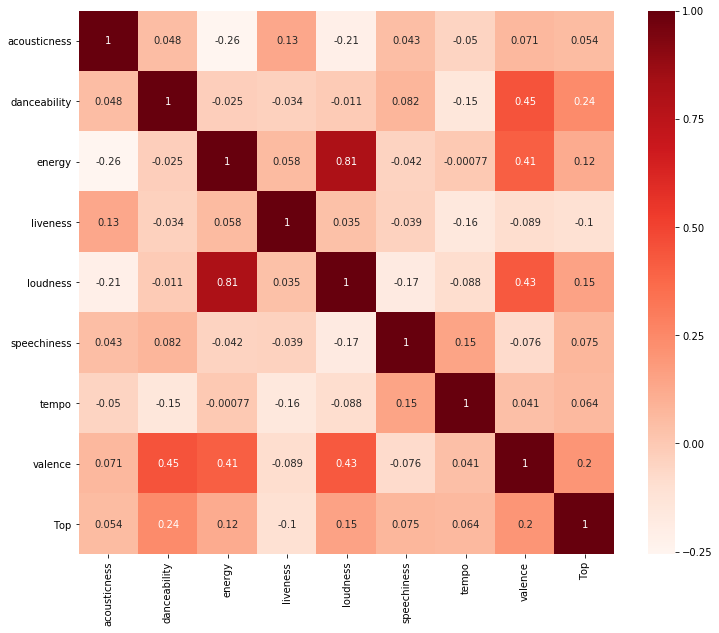

In [14]:
# Se seleccionan las columnas con las que se van a correr los modelos 
columnas = ['acousticness', 'danceability', 'energy', 'liveness', 'loudness','speechiness', 'tempo', 'valence', 'Top']

df_final = df_unicas[columnas]

# Se revisa la correlación entre las variables
plt.figure(figsize=(12,10))
cor = df_final.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [15]:
# se define una función para construir los dataframe por región

def df_region(region, df, lista_columnas, columna_objetivo):
    df = df[df['Region']==region]
    x_columns = lista_columnas.copy()
    x_columns.remove(columna_objetivo)
    X = df[x_columns]
    y = df[columna_objetivo]
    return train_test_split(X, y, test_size=0.4, random_state=0)

**Supuestos**

- No se tiene en cuenta la fecha de una 
- El artista y el nombre es solo para identificar la información

<h1 style="text-align:center;color:blue" }>Análisis canciones en el Top Global</h1>

In [23]:
X_train, X_test, y_train, y_test = df_region('global',df_unicas,columnas,'Top')
print (X_train.shape, X_test.shape)

(82, 8) (56, 8)


## Modelo lasso 

In [90]:
#Encontrar el mejor parámetro pora alpha
alphas = 10**np.linspace(6,-2,50)*0.5
alphas

array([5.00000000e+05, 3.43324423e+05, 2.35743318e+05, 1.61872877e+05,
       1.11149824e+05, 7.63208984e+04, 5.24056567e+04, 3.59842837e+04,
       2.47085668e+04, 1.69661089e+04, 1.16497591e+04, 7.99929360e+03,
       5.49270571e+03, 3.77156003e+03, 2.58973734e+03, 1.77824015e+03,
       1.22102655e+03, 8.38416468e+02, 5.75697700e+02, 3.95302161e+02,
       2.71433772e+02, 1.86379686e+02, 1.27977396e+02, 8.78755312e+01,
       6.03396320e+01, 4.14321386e+01, 2.84493301e+01, 1.95346997e+01,
       1.34134790e+01, 9.21034985e+00, 6.32427608e+00, 4.34255687e+00,
       2.98181166e+00, 2.04745753e+00, 1.40588435e+00, 9.65348864e-01,
       6.62855683e-01, 4.55149089e-01, 3.12527596e-01, 2.14596713e-01,
       1.47352585e-01, 1.01179482e-01, 6.94747747e-02, 4.77047738e-02,
       3.27564278e-02, 2.24921633e-02, 1.54442180e-02, 1.06047544e-02,
       7.28174239e-03, 5.00000000e-03])

In [91]:
lasso = linear_model.Lasso(max_iter=10000, normalize=True)
coefs = []

for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    
np.shape(coefs)

(50, 8)

Text(0, 0.5, 'weights')

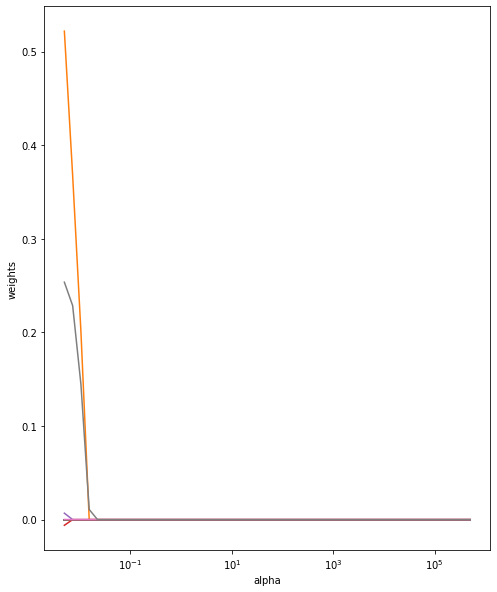

In [92]:
#Gráfica del párametro de calibración alpha
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

In [93]:
#Crossvalidation para encontrar el mejor alpha 
lassocv = linear_model.LassoCV(alphas=None, cv=10, max_iter=100000, normalize=True)
lassocv.fit(X_train, y_train)
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)
print(lasso.coef_)
print(lasso.intercept_)

[-0.          0.24867713  0.         -0.          0.         -0.
  0.          0.1686159 ]
0.11894413538668158


In [94]:
print("Alpha=", lassocv.alpha_)
print("mse = ",mean_squared_error(y_test, lasso.predict(X_test)))
print("best model coefficients:")
pd.Series(lasso.coef_, index=X_train.columns)

Alpha= 0.009649077782708789
mse =  0.21811955399248245
best model coefficients:


acousticness   -0.000000
danceability    0.248677
energy          0.000000
liveness       -0.000000
loudness        0.000000
speechiness    -0.000000
tempo           0.000000
valence         0.168616
dtype: float64

### Sólo 2 de los 13 coeficientes son distintos de cero. Es decir, que atributos como danzabilidad y valance aportan a nuestro modelo. Sin embargo, se realiza ridge para comparar que modelo penaliza mejor. 

In [42]:
lasso.score(X_test, y_test)*100

2.699442201931024

Lasso picked 2 variables and eliminated the other 6 variables


Text(0.5, 1.0, 'Feature importance using Lasso Model')

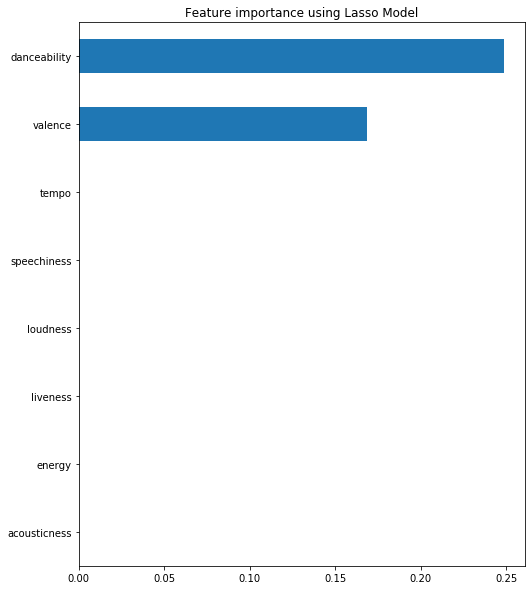

In [43]:
coef = pd.Series(lasso.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " 
      +  str(sum(coef == 0)) + " variables")
imp_coef = coef.sort_values()
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Lasso Model")


## Modelo Ridge

In [95]:
ridgecv =linear_model.RidgeCV(alphas=alphas, normalize=True)
ridgecv.fit(X_train, y_train)
print("Alpha=", ridgecv.alpha_)

Alpha= 1.4058843489871153


In [96]:
ridge = Ridge(alpha=ridgecv.alpha_, normalize=True)
ridge.fit(X_train, y_train)

Ridge(alpha=1.4058843489871153, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=True, random_state=None, solver='auto', tol=0.001)

In [97]:
print(ridge.coef_)
print(ridge.intercept_)

[-0.01685545  0.4099708   0.10805524 -0.17999248  0.00991564 -0.09979078
  0.0006066   0.17535905]
-0.04932644144940701


In [98]:
print("mse = ",mean_squared_error(y_test, ridge.predict(X_test)))
print("best model coefficients:")
pd.Series(ridge.coef_, index=X_train.columns)

mse =  0.2135546540368008
best model coefficients:


acousticness   -0.016855
danceability    0.409971
energy          0.108055
liveness       -0.179992
loudness        0.009916
speechiness    -0.099791
tempo           0.000607
valence         0.175359
dtype: float64

In [99]:
ridge.score(X_test, y_test)*100

4.735790176471221

Ridge picked 8 variables and eliminated the other 0 variables


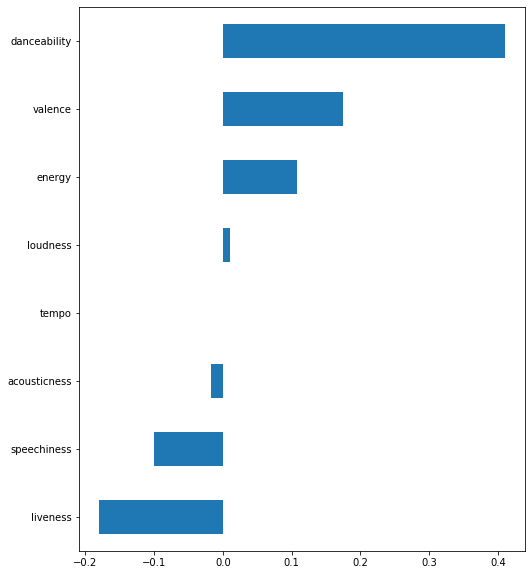

In [100]:
coef = pd.Series(ridge.coef_, index = X_train.columns)
print("Ridge picked " + str(sum(coef != 0)) + " variables and eliminated the other " 
      +  str(sum(coef == 0)) + " variables")
imp_coef = coef.sort_values()
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
#plt.title("Feature importance using Ridge Model")

In [104]:
#Comparación de algoritmos de penalización
print("MSE RIDGE = ",mean_squared_error(y_test, ridge.predict(X_test)))
print("MSE LASSO = ",mean_squared_error(y_test, lasso.predict(X_test)))

MSE RIDGE =  0.2135546540368008
MSE LASSO =  0.21811955399248245


### Conclusion:  Se observa que Ridge nos da un menor MSE que Lasso-> COMPLETAR 


## Modelo Logit

In [156]:
logit = LogisticRegression(random_state=0)
logit.fit(X_train, y_train)

C:\Users\ap.chacon511\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [157]:
print(logit.coef_)
print(logit.intercept_)

[[-0.02478917  0.67659855 -0.3435     -0.52737376  0.19877535 -0.058041
   0.00341223  0.8721102 ]]
[-0.41069928]


In [158]:
logit.score(X_test, y_test)*100

73.21428571428571

In [159]:
print("MSE LOGIT = ",mean_squared_error(y_test, logit.predict(X_test)))

MSE LOGIT =  0.26785714285714285


## Modelo Ramdom Forest

In [82]:
#Usar el pram_grid para encontrar los mejores parámetros y calibrar
RandomForest=RandomForestClassifier(random_state=2)
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [83]:
RandomForestcv= GridSearchCV(estimator=RandomForest, param_grid=param_grid, cv= 10)
RandomForestcv.fit(X_train, y_train)
RandomForestcv.best_params_

C:\Users\ap.chacon511\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'criterion': 'gini',
 'max_depth': 4,
 'max_features': 'auto',
 'n_estimators': 200}

In [84]:
#Se corre el modelo con los mejores parámetros
RandomForest = RandomForestClassifier(random_state=2, max_features='auto', n_estimators= 200, max_depth=4, criterion='gini')
RandomForest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=4, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=2, verbose=0,
                       warm_start=False)

In [85]:
RandomForest.score(X_test, y_test)*100

71.42857142857143

In [86]:
print("MSE RANDOM FOREST = ", mean_squared_error(y_test, RandomForest.predict(X_test)))
print("Accuracy RANDOM FOREST: ",accuracy_score(y_test,RandomForest.predict(X_test)))

MSE RANDOM FOREST =  0.2857142857142857
Accuracy RANDOM FOREST:  0.7142857142857143


In [87]:
#Importancia de las variables 
var_impor=pd.Series(RandomForest.feature_importances_, index=X_test.columns)
print (var_impor.sort_values(ascending=False))

valence         0.175610
danceability    0.132971
tempo           0.129406
energy          0.120966
speechiness     0.115654
liveness        0.113783
loudness        0.111495
acousticness    0.100115
dtype: float64


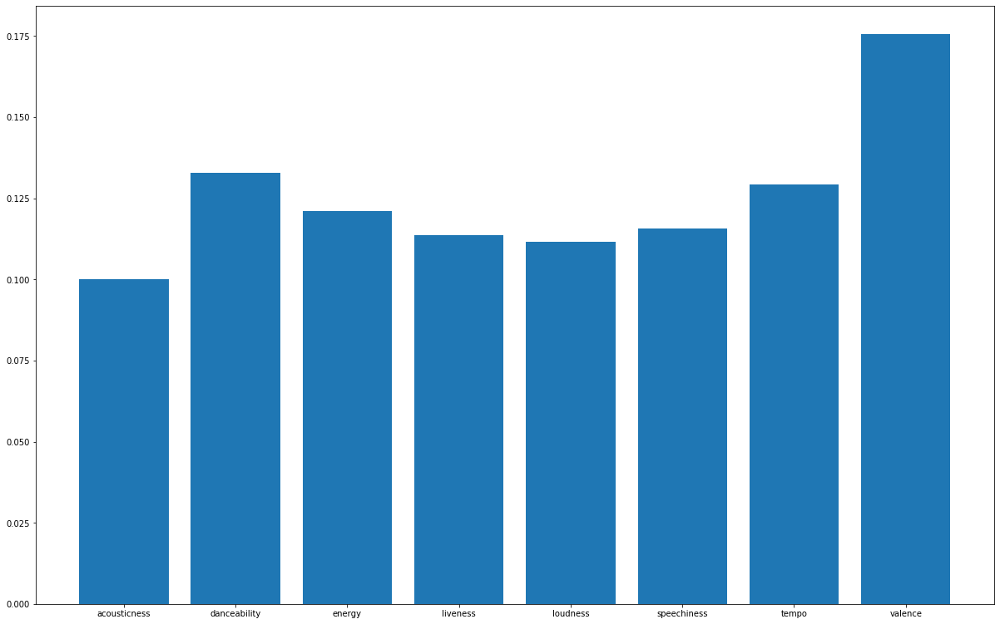

In [136]:
#Plot de importancia de variables
fig = plt.figure()
ax = fig.add_axes([1,1,2,1])
plt.bar(X_test.columns, RandomForest.feature_importances_)
plt.show()

In [137]:
#Matriz de confusión 
print(confusion_matrix(y_test,RandomForest.predict(X_test)))
print(classification_report(y_test, RandomForest.predict(X_test)))

[[35  2]
 [14  5]]
              precision    recall  f1-score   support

         0.0       0.71      0.95      0.81        37
         1.0       0.71      0.26      0.38        19

    accuracy                           0.71        56
   macro avg       0.71      0.60      0.60        56
weighted avg       0.71      0.71      0.67        56



<h3 style="color:blue"> Validación Random Forest con base de top canciones 2019 </h3>


In [108]:
#Cargar base 
df_validation=  pd.read_csv('top50contry.csv', sep=',' , encoding='latin-1')
    df_validation.head()


,Unnamed: 0,title,artist,top genre,year,added,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop,country
0,1,Dance Monkey,Tones and I,australian pop,2019,1969-12-31,98.0,59.0,82.0,-6.0,15.0,51.0,209,69.0,9.0,100,world
1,2,ROXANNE,Arizona Zervas,pop rap,2019,1969-12-31,117.0,60.0,62.0,-6.0,46.0,46.0,164,5.0,15.0,99,world
2,3,Memories,Maroon 5,pop,2019,1969-12-31,91.0,32.0,76.0,-7.0,8.0,57.0,189,84.0,5.0,99,world
3,4,Circles,Post Malone,dfw rap,2019,1969-12-31,120.0,76.0,70.0,-3.0,9.0,55.0,215,19.0,4.0,99,world
4,5,All I Want for Christmas Is You,Mariah Carey,dance pop,1994,1969-12-31,150.0,63.0,34.0,-7.0,7.0,35.0,241,16.0,4.0,98,world


In [109]:
#Base de datos validación global
df_validation_w = df_validation[df_validation['country']=='world']

df_validation_w= df_validation_w.sample(frac = 0.5, replace = True , random_state=123)
df_validation_w.shape


(25, 17)

In [110]:
for song in set(df_validation_w['title']):
    if df_validation_w[df_validation_w['title']==song].min()['Unnamed: 0'] < (15 + 1):
        df_validation_w.loc[df_validation_w[df_validation_w['title']==song].index,'Top']= 1
    else:
        df_validation_w.loc[df_validation_w[df_validation_w['title']==song].index,'Top']= 0

df_validation_w[['title','Top']]


,title,Top
45,Holly Jolly Christmas,0.0
2,Memories,1.0
28,Christmas (Baby Please Come Home),0.0
34,Santa Baby,0.0
38,Feliz Navidad,0.0
17,Mistletoe,0.0
19,Wonderful Christmastime - Edited Version / Rem...,0.0
42,My Only Wish (This Year),0.0
22,Let It Snow! Let It Snow! Let It Snow!,0.0
33,Christmas Lights,0.0


In [223]:
columnas=['bpm','nrgy', 'dnce', 'dB', 'live', 'val', 'dur', 'acous', 'spch','Top']            
            
df_final_val_world =df_validation_w[columnas]

In [224]:
df_final_val_world.head()

,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,Top
45,151.0,43.0,61.0,-9.0,9.0,74.0,122,86.0,4.0,0.0
2,91.0,32.0,76.0,-7.0,8.0,57.0,189,84.0,5.0,1.0
28,127.0,78.0,57.0,-7.0,11.0,70.0,153,2.0,3.0,0.0
34,96.0,78.0,75.0,-6.0,28.0,77.0,171,5.0,14.0,0.0
38,149.0,86.0,49.0,-7.0,35.0,96.0,182,53.0,4.0,0.0


In [225]:
# se define una función para construir los dataframe por región

def def_final(country, df, lista_columnas, columna_objetivo):
    df = df[df['country']==country]
    x_columns = lista_columnas.copy()
    x_columns.remove(columna_objetivo)
    X = df[x_columns]
    y = df[columna_objetivo]
    return X, y

In [226]:
X, y = def_final('world',df_validation_w,columnas,'Top')
print (X.shape, y.shape)
X.head()

(25, 9) (25,)


,bpm,nrgy,dnce,dB,live,val,dur,acous,spch
45,151.0,43.0,61.0,-9.0,9.0,74.0,122,86.0,4.0
2,91.0,32.0,76.0,-7.0,8.0,57.0,189,84.0,5.0
28,127.0,78.0,57.0,-7.0,11.0,70.0,153,2.0,3.0
34,96.0,78.0,75.0,-6.0,28.0,77.0,171,5.0,14.0
38,149.0,86.0,49.0,-7.0,35.0,96.0,182,53.0,4.0


In [227]:
#Se corre el modelo con los mejores parámetros con la base de validación
RandomForest_val = RandomForestClassifier(random_state=2, max_features='auto', n_estimators= 200, max_depth=4, criterion='gini')
RandomForest_val.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=4, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=2, verbose=0,
                       warm_start=False)

In [228]:
RandomForest_val.score(X, y)*100

100.0

In [229]:
print("MSE RANDOM FOREST = ", mean_squared_error(y, RandomForest_val.predict(X)))
print("Accuracy RANDOM FOREST: ",accuracy_score(y,RandomForest_val.predict(X)))

MSE RANDOM FOREST =  0.0
Accuracy RANDOM FOREST:  1.0


In [230]:
#Matriz de confusión 
print(confusion_matrix(y,RandomForest_val.predict(X)))
print(classification_report(y, RandomForest_val.predict(X)))

[[21  0]
 [ 0  4]]
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        21
         1.0       1.00      1.00      1.00         4

    accuracy                           1.00        25
   macro avg       1.00      1.00      1.00        25
weighted avg       1.00      1.00      1.00        25



<h3 style="color:blue"> Random Forest eliminando variables que no agregan información según modelo de penalización Ridge </h3>


In [45]:
#Se corre el modelo eliminando las columnas que no agregan información al modelo según Ridge 
columnas2 = ['acousticness', 'danceability', 'energy',
           'instrumentalness', 'liveness', 'loudness', 'mode',
           'speechiness', 'time_signature', 'valence', 'Top']
df_final2 = df_unicas[columnas2]


X_train2, X_test2, y_train2, y_test2 = df_region('global',df_unicas,columnas2,'Top')
print (X_train2.shape, X_test2.shape)

(82, 10) (56, 10)


In [46]:
RandomForestcv= GridSearchCV(estimator=RandomForest, param_grid=param_grid, cv= 10)
RandomForestcv.fit(X_train2, y_train2)
RandomForestcv.best_params_

{'criterion': 'entropy',
 'max_depth': 4,
 'max_features': 'auto',
 'n_estimators': 500}

In [47]:
#Se corre el modelo con los mejores parámetros
RandomForest = RandomForestClassifier(random_state=2, max_features='auto', n_estimators= 500, max_depth=4, criterion='entropy')
RandomForest.fit(X_train2, y_train2)
print("MSE RANDOM FOREST 2 = ", mean_squared_error(y_test, RandomForest.predict(X_test2)))
print("Accuracy RANDOM FOREST 2: ",accuracy_score(y_test,RandomForest.predict(X_test2)))

MSE RANDOM FOREST 2 =  0.26785714285714285
Accuracy RANDOM FOREST 2:  0.7321428571428571


In [48]:
#Matriz de confusión 
print(confusion_matrix(y_test,RandomForest.predict(X_test2)))
print(classification_report(y_test, RandomForest.predict(X_test2)))

[[36  1]
 [14  5]]
              precision    recall  f1-score   support

         0.0       0.72      0.97      0.83        37
         1.0       0.83      0.26      0.40        19

    accuracy                           0.73        56
   macro avg       0.78      0.62      0.61        56
weighted avg       0.76      0.73      0.68        56



#### Eliminando las variables que no aportan al modelo, se reduce la exactitud del modelo y el error aumenta 
# AGREGAR CONCLUSIONES

## Modelo K-Nearest Neighbor

([<matplotlib.axis.XTick at 0x209637fd448>,
 <a list of 5 Text major ticklabel objects>)

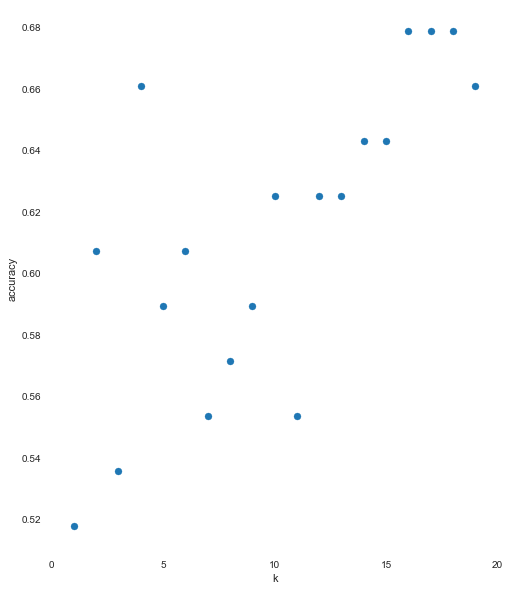

In [49]:
#Encontrar el número de K optimo
k_range = range(1, 20)
scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_train, y_train)
    scores.append(knn.score(X_test, y_test))
plt.figure()
plt.xlabel('k')
plt.ylabel('accuracy')
plt.scatter(k_range, scores)
plt.xticks([0,5,10,15,20])

### Se observa que el número de clusters óptimo es 4 

In [50]:
n_neighbors = 4
 
knn = KNeighborsClassifier(n_neighbors)
knn.fit(X_train, y_train)

print('Accuracy of K-NN en training: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN en classifieren test: {:.2f}'
     .format(knn.score(X_test, y_test)))


Accuracy of K-NN en training: 0.74
Accuracy of K-NN en classifieren test: 0.66


In [51]:
#Matriz de confusión 
print(confusion_matrix(y_test, knn.predict(X_test)))
print(classification_report(y_test, knn.predict(X_test)))

[[33  4]
 [15  4]]
              precision    recall  f1-score   support

         0.0       0.69      0.89      0.78        37
         1.0       0.50      0.21      0.30        19

    accuracy                           0.66        56
   macro avg       0.59      0.55      0.54        56
weighted avg       0.62      0.66      0.61        56



In [52]:
knn.score(X_test, y_test)*100

66.07142857142857

In [53]:
print("MSE K-NN = ", mean_squared_error(y_test, knn.predict(X_test)))

MSE K-NN =  0.3392857142857143


## Modelo SVM

### Modelo SVM - Lineal

In [54]:
#Modelo SVM Lineal Simple

svm_model = svm.SVC(kernel='linear')
svm_model.fit(X_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [55]:
#Función de resultados

def svm_report (svm_model):
    print("Coeficientes: ", "\n"*2,  svm_model.coef_)
    print()
    print("Intercepto: ", "\n"*2,  svm_model.intercept_)
    print()
    print("Scores: ", "\n"*2,  svm_model.score(X_test, y_test)*100)
    print()
    print("MSE: ", "\n"*2, mean_squared_error(y_test, svm_model.predict(X_test)))
    print()
    print("Matriz de Confusión: ", "\n"*2, confusion_matrix(y_test,svm_model.predict(X_test)))
    print()
    print("Reporte de Clasificación: ", "\n"*2, classification_report(y_test,svm_model.predict(X_test)))

In [56]:
svm_report(svm_model)

Coeficientes:  

 [[ 0.74613097  1.13815689  0.07284534  0.90100993 -0.04928663 20.94425148
  -0.10834745  8.07783423  5.58630738 -0.61200695  3.28756651 -1.
   1.06607621]]

Intercepto:  

 [-17577.61674795]

Scores:  

 58.92857142857143

MSE:  

 0.4107142857142857

Matriz de Confusión:  

 [[28  9]
 [14  5]]

Reporte de Clasificación:  

               precision    recall  f1-score   support

         0.0       0.67      0.76      0.71        37
         1.0       0.36      0.26      0.30        19

    accuracy                           0.59        56
   macro avg       0.51      0.51      0.51        56
weighted avg       0.56      0.59      0.57        56



Valor de C:  

 1 


Coeficientes:  

 [[ 0.74613097  1.13815689  0.07284534  0.90100993 -0.04928663 20.94425148
  -0.10834745  8.07783423  5.58630738 -0.61200695  3.28756651 -1.
   1.06607621]]

Intercepto:  

 [-17577.61674795]

Scores:  

 58.92857142857143

MSE:  

 0.4107142857142857

Matriz de Confusión:  

 [[28  9]
 [14  5]]

Reporte de Clasificación:  

               precision    recall  f1-score   support

         0.0       0.67      0.76      0.71        37
         1.0       0.36      0.26      0.30        19

    accuracy                           0.59        56
   macro avg       0.51      0.51      0.51        56
weighted avg       0.56      0.59      0.57        56




Valor de C:  

 2 


Coeficientes:  

 [[ 0.6488774   1.96456453  0.06606939  2.00403726 -0.22929134 58.16232753
  -0.20327252 27.24090508 10.80484134 -0.91506407 -6.60293327 -2.
   3.41852592]]

Intercepto:  

 [-17682.3974914]

Scores:  

 64.28571428571429

MSE:  

 0.35714285714285715

Matriz de Con

([<matplotlib.axis.XTick at 0x209622cee88>,
 <a list of 3 Text major ticklabel objects>)

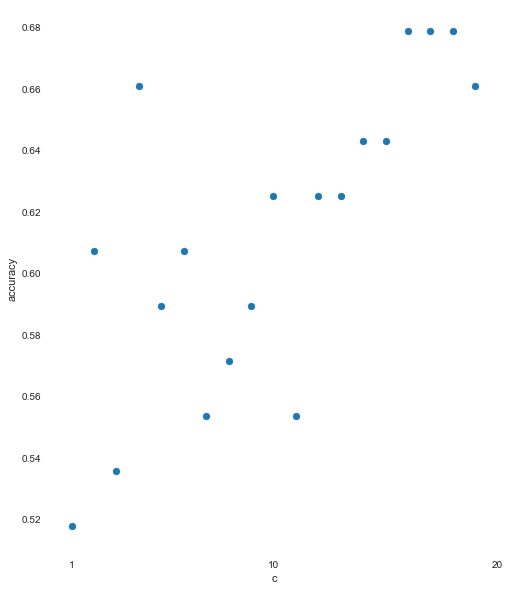

In [57]:
#Modelo SVM Lineal - C Óptimo

class color:
   BOLD = '\033[1m'
   END = '\033[0m'

c_range = range(1, 20)
for c in c_range:
    svm_model = svm.SVC(kernel='linear', C = c)
    svm_model.fit(X_train, y_train)
    print(color.BOLD +"Valor de C: ", "\n"*2, c,"\n"*2+color.END)
    svm_report(svm_model)
    print("\n"*2)
plt.figure()
plt.xlabel('c')
plt.ylabel('accuracy')
plt.scatter(c_range, scores)
plt.xticks([1,10,20])

### Modelo SVM - Polinomial

In [58]:
#Función de resultados 2

def svm_report_2 (svm_model):
    print("Scores: ", "\n"*2,  svm_model.score(X_test, y_test)*100)
    print()
    print("MSE: ", "\n"*2, mean_squared_error(y_test, svm_model.predict(X_test)))
    print()
    print("Matriz de Confusión: ", "\n"*2, confusion_matrix(y_test,svm_model.predict(X_test)))

In [59]:
#Modelo SVM Poly - C y Grados Óptimos

d_range = range(2, 6)

for d in d_range:
    svm_model = svm.SVC(kernel='poly', degree=d)
    svm_model.fit(X_train, y_train)
    print(color.BOLD +"Valor de Degree: ", "\n"*2, d,"\n"*2+color.END)
    svm_report_2(svm_model)
    print("\n"*2)      

Valor de Degree:  

 2 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Degree:  

 3 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Degree:  

 4 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Degree:  

 5 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]





### Modelo SVM - RBF

In [60]:
#Modelo SVM RBF - Gamma Óptimo

g_range = range(1, 20)

for g in g_range:
    svm_model = svm.SVC(kernel='rbf', gamma=g)
    svm_model.fit(X_train, y_train)
    print(color.BOLD +"Valor de Gamma: ", "\n"*2, g,"\n"*2+color.END)
    svm_report_2(svm_model)
    print("\n"*2) 

Valor de Gamma:  

 1 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Gamma:  

 2 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Gamma:  

 3 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Gamma:  

 4 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Gamma:  

 5 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Gamma:  

 6 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Gamma:  

 7 


Scores:  

 66.07142857142857

MSE:  

 0.3392857142857143

Matriz de Confusión:  

 [[37  0]
 [19  0]]



Valor de Gamma:  

 8 


Scores:  

 66.07142857142857

MSE:  

 0.339285714

## Conclusiones:

 **1.** Los modelaciones de SVM parecen tener problema en la identificaciòn de las clases.
 
 **2.** Los modelos de SVM con kernels: Polinomial y RBF solo logran la clasificación ideal de una de las clases
 
 **3.** El modelo de SVM con kernel lineal encuentra su  parámetro C con Accuracy óptimo en 16, sim embargo hay uno cercano en 4. 
 
 **4.** El modelo dee Random Forest parece cumplir mejor las necesidades que las diferentes metodologías de SVM
 
 **5.** Para un análisis próximo se podrìan dividir los datos en entrenamiento y prueba mediante un algoritmo de Cross-Validation


<h1 style="text-align:center;color:red">Análisis canciones en el Top Colombia</h1>

In [61]:
X_train, X_test, y_train, y_test = df_region('co',df_unicas,columnas,'Top')
print (X_train.shape, X_test.shape)

(63, 13) (43, 13)


## Modelo lasso 

In [62]:
#Encontrar el mejor parámetro pora alpha
alphas = 10**np.linspace(6,-2,50)*0.5
alphas

array([5.00000000e+05, 3.43324423e+05, 2.35743318e+05, 1.61872877e+05,
       1.11149824e+05, 7.63208984e+04, 5.24056567e+04, 3.59842837e+04,
       2.47085668e+04, 1.69661089e+04, 1.16497591e+04, 7.99929360e+03,
       5.49270571e+03, 3.77156003e+03, 2.58973734e+03, 1.77824015e+03,
       1.22102655e+03, 8.38416468e+02, 5.75697700e+02, 3.95302161e+02,
       2.71433772e+02, 1.86379686e+02, 1.27977396e+02, 8.78755312e+01,
       6.03396320e+01, 4.14321386e+01, 2.84493301e+01, 1.95346997e+01,
       1.34134790e+01, 9.21034985e+00, 6.32427608e+00, 4.34255687e+00,
       2.98181166e+00, 2.04745753e+00, 1.40588435e+00, 9.65348864e-01,
       6.62855683e-01, 4.55149089e-01, 3.12527596e-01, 2.14596713e-01,
       1.47352585e-01, 1.01179482e-01, 6.94747747e-02, 4.77047738e-02,
       3.27564278e-02, 2.24921633e-02, 1.54442180e-02, 1.06047544e-02,
       7.28174239e-03, 5.00000000e-03])

In [63]:
lasso = linear_model.Lasso(max_iter=10000, normalize=True)
coefs = []

for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    coefs.append(lasso.coef_)
    
np.shape(coefs)

(50, 13)

Text(0, 0.5, 'weights')

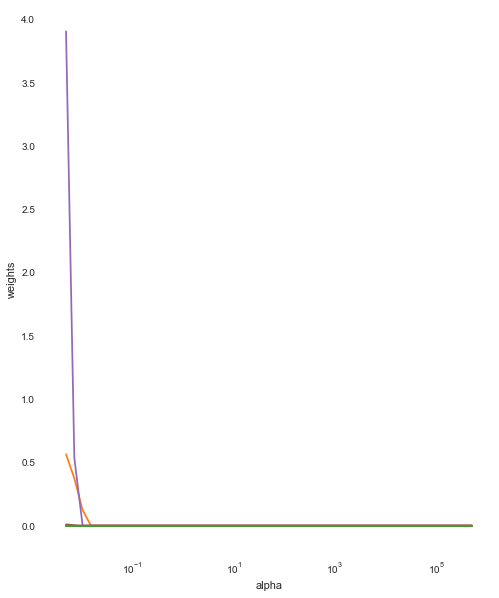

In [64]:
#Gráfica del párametro de calibración alpha
ax = plt.gca()
ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('weights')

In [65]:
#Crossvalidation paraencontrar el mejor alpha 
lassocv = linear_model.LassoCV(alphas=None, cv=10, max_iter=100000, normalize=True)
lassocv.fit(X_train, y_train)
lasso.set_params(alpha=lassocv.alpha_)
lasso.fit(X_train, y_train)
print(lasso.coef_)
print(lasso.intercept_)

[ 0.  0.  0.  0.  0.  0. -0.  0.  0.  0.  0.  0.  0.]
0.5238095238095238


In [66]:
print("Alpha=", lassocv.alpha_)
print("mse = ",mean_squared_error(y_test, lasso.predict(X_test)))
print("best model coefficients:")
pd.Series(lasso.coef_, index=X_train.columns)

Alpha= 0.012172624538101653
mse =  0.25333544270421343
best model coefficients:


acousticness        0.0
danceability        0.0
duration_ms         0.0
energy              0.0
instrumentalness    0.0
key                 0.0
liveness           -0.0
loudness            0.0
mode                0.0
speechiness         0.0
tempo               0.0
time_signature      0.0
valence             0.0
dtype: float64

In [67]:
lasso.score(X_test, y_test)*100

-2.7230775351075875

Lasso picked 0 variables and eliminated the other 13 variables


Text(0.5, 1.0, 'Feature importance using Lasso Model')

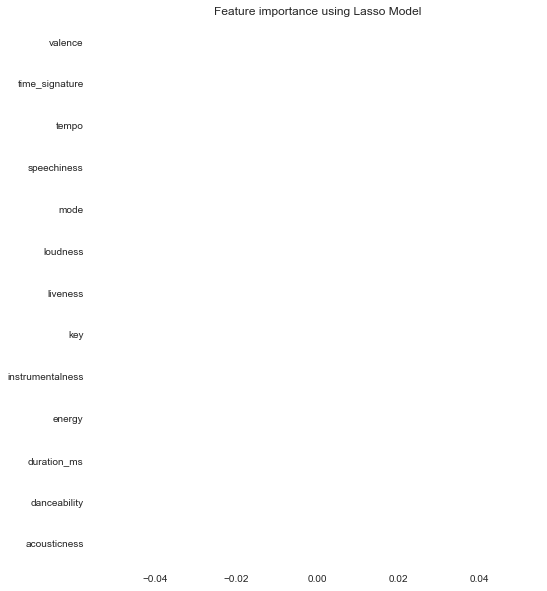

In [68]:
coef = pd.Series(lasso.coef_, index = X_train.columns)
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " 
      +  str(sum(coef == 0)) + " variables")
imp_coef = coef.sort_values()
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Lasso Model")


## Modelo Ridge

In [69]:
ridgecv =linear_model.RidgeCV(alphas=alphas, normalize=True)
ridgecv.fit(X_train, y_train)
print("Alpha=", ridgecv.alpha_)

Alpha= 500000.0


In [70]:
ridge = Ridge(alpha=ridgecv.alpha_, normalize=True)
ridge.fit(X_train, y_train)

Ridge(alpha=500000.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=True, random_state=None, solver='auto', tol=0.001)

In [71]:
print(ridge.coef_)
print(ridge.intercept_)

[ 1.90657811e-07  1.90263877e-06  2.01093026e-12  4.06503550e-07
  1.54844793e-05  4.27465004e-08 -5.38289204e-07  3.81021254e-08
  2.43409179e-08  7.81552217e-07  2.37593482e-09  0.00000000e+00
  2.64892137e-07]
0.5238069736974765


In [72]:
print("mse = ",mean_squared_error(y_test, ridge.predict(X_test)))
print("best model coefficients:")
pd.Series(ridge.coef_, index=X_train.columns)

mse =  0.25333535093482024
best model coefficients:


acousticness        1.906578e-07
danceability        1.902639e-06
duration_ms         2.010930e-12
energy              4.065036e-07
instrumentalness    1.548448e-05
key                 4.274650e-08
liveness           -5.382892e-07
loudness            3.810213e-08
mode                2.434092e-08
speechiness         7.815522e-07
tempo               2.375935e-09
time_signature      0.000000e+00
valence             2.648921e-07
dtype: float64

In [73]:
ridge.score(X_test, y_test)*100

-2.723040324228631

In [74]:
mean_squared_error(y_test, ridge.predict(X_test))

0.25333535093482024

Ridge picked 12 variables and eliminated the other 1 variables


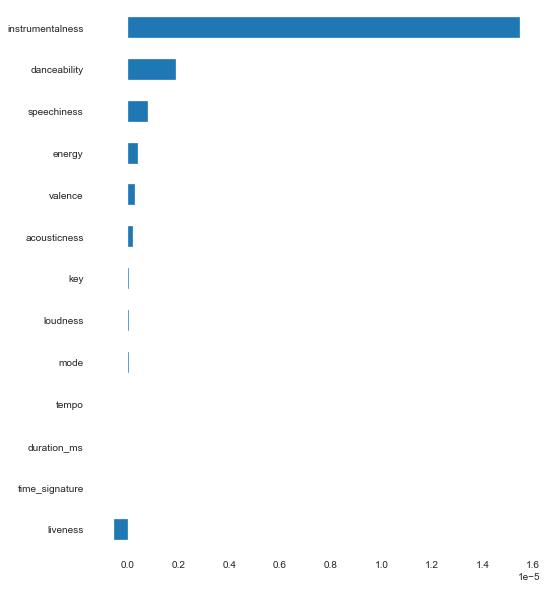

In [75]:
coef = pd.Series(ridge.coef_, index = X_train.columns)
print("Ridge picked " + str(sum(coef != 0)) + " variables and eliminated the other " 
      +  str(sum(coef == 0)) + " variables")
imp_coef = coef.sort_values()
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
#plt.title("Feature importance using Ridge Model")

In [76]:
#Comparación de algoritmos de penalización
print("MSE ridge = ",mean_squared_error(y_test, ridge.predict(X_test)))
print("MSE lasso = ",mean_squared_error(y_test, lasso.predict(X_test)))

MSE ridge =  0.25333535093482024
MSE lasso =  0.25333544270421343


## Modelo Logit

In [77]:
logit = LogisticRegression(random_state=0)
logit.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [78]:
print(logit.coef_)
print(logit.intercept_)

[[ 8.39222284e-13  5.25425271e-12  5.20112238e-07  1.78234374e-12
   2.25431956e-13  1.35798814e-10 -1.94723644e-12  3.90392923e-11
   1.52821244e-12  9.72638505e-13  6.24325874e-10 -1.75344458e-12
   3.23694092e-12]]
[-4.38361144e-13]


In [79]:
logit.score(X_test, y_test)*100

44.18604651162791

In [80]:
print("MSE lOGIT = ", mean_squared_error(y_test, logit.predict(X_test)))

MSE lOGIT =  0.5581395348837209


## Modelo Ramdom Forest

In [81]:
#Usar el pram_grid para encontrar los mejores parámetros y calibrar
RandomForest=RandomForestClassifier(random_state=2)
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [82]:
RandomForestcv= GridSearchCV(estimator=RandomForest, param_grid=param_grid, cv= 10)
RandomForestcv.fit(X_train, y_train)
RandomForestcv.best_params_

{'criterion': 'gini',
 'max_depth': 7,
 'max_features': 'auto',
 'n_estimators': 500}

In [83]:
#Se corre el modelo con los mejores parámetros
RandomForest = RandomForestClassifier(random_state=2, max_features='auto', n_estimators= 500, max_depth= 7, criterion='gini')
RandomForest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=2, verbose=0,
                       warm_start=False)

In [84]:
RandomForest.score(X_test, y_test)*100

48.837209302325576

In [85]:
print("MSE RANDOM FOREST = ", mean_squared_error(y_test, RandomForest.predict(X_test)))
print("Accuracy RANDOM FOREST: ",accuracy_score(y_test,RandomForest.predict(X_test)))

MSE RANDOM FOREST =  0.5116279069767442
Accuracy RANDOM FOREST:  0.4883720930232558


In [86]:
#Importancia de las variables 
var_impor=pd.Series(RandomForest.feature_importances_, index=X_test.columns)
print (var_impor.sort_values(ascending=False))

speechiness         0.135826
valence             0.103406
key                 0.103281
danceability        0.091150
energy              0.088886
duration_ms         0.087288
loudness            0.084553
tempo               0.082982
liveness            0.081991
acousticness        0.079134
instrumentalness    0.052192
mode                0.009311
time_signature      0.000000
dtype: float64


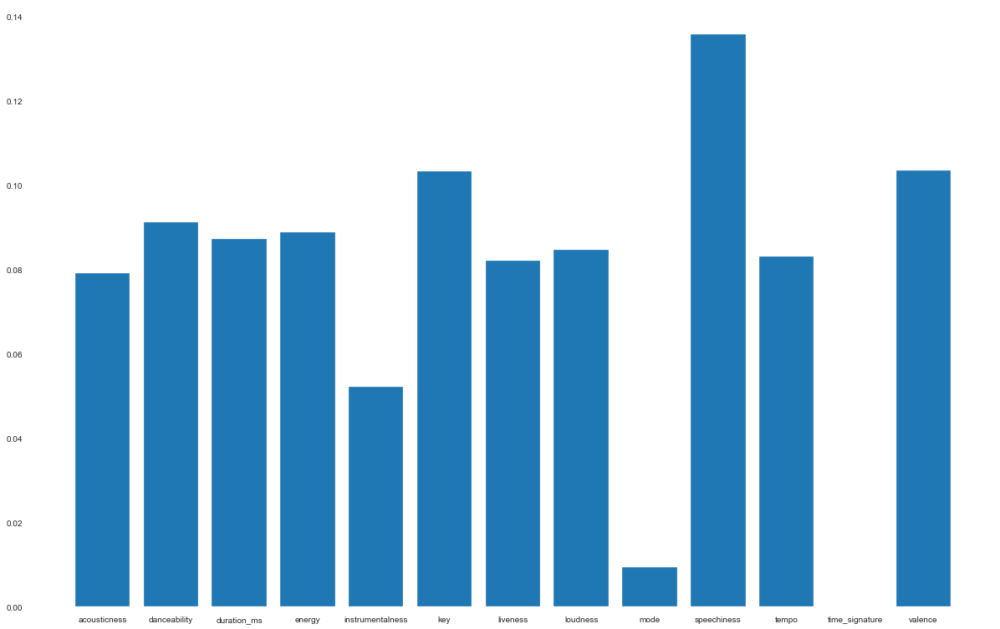

In [87]:
#Plot de importancia de variables
fig = plt.figure()
ax = fig.add_axes([1,1,2,1])
plt.bar(X_test.columns, RandomForest.feature_importances_)
plt.show()

In [88]:
#Matriz de confusión 
print(confusion_matrix(y_test,RandomForest.predict(X_test)))
print(classification_report(y_test, RandomForest.predict(X_test)))

[[ 7 17]
 [ 5 14]]
              precision    recall  f1-score   support

         0.0       0.58      0.29      0.39        24
         1.0       0.45      0.74      0.56        19

    accuracy                           0.49        43
   macro avg       0.52      0.51      0.47        43
weighted avg       0.53      0.49      0.46        43



<h3 style="color:blue"> Validación Random Forest con base de top canciones 2019 Colombia </h3>

In [123]:
#Cargar nueva base de validación
df_validation=  pd.read_csv('top50contry.csv', sep=',' , encoding='latin-1')
df_validation.head()

,Unnamed: 0,title,artist,top genre,year,added,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop,country
0,1,Dance Monkey,Tones and I,australian pop,2019,1969-12-31,98.0,59.0,82.0,-6.0,15.0,51.0,209,69.0,9.0,100,world
1,2,ROXANNE,Arizona Zervas,pop rap,2019,1969-12-31,117.0,60.0,62.0,-6.0,46.0,46.0,164,5.0,15.0,99,world
2,3,Memories,Maroon 5,pop,2019,1969-12-31,91.0,32.0,76.0,-7.0,8.0,57.0,189,84.0,5.0,99,world
3,4,Circles,Post Malone,dfw rap,2019,1969-12-31,120.0,76.0,70.0,-3.0,9.0,55.0,215,19.0,4.0,99,world
4,5,All I Want for Christmas Is You,Mariah Carey,dance pop,1994,1969-12-31,150.0,63.0,34.0,-7.0,7.0,35.0,241,16.0,4.0,98,world


In [125]:
#Base de datos validación global
df_validation_co = df_validation[df_validation['country']=='colombia']

#df_validation_co= df_validation_co.sample(frac = 0.5, replace = True , random_state=123)
df_validation_co.shape

(50, 17)

In [126]:
df_validation_co

,Unnamed: 0,title,artist,top genre,year,added,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop,country
450,451,Dance Monkey,Tones and I,australian pop,2019,1969-12-31,98.0,59.0,82.0,-6.0,15.0,51.0,209,69.0,9.0,100,colombia
451,452,RITMO (Bad Boys For Life),The Black Eyed Peas,dance pop,2019,1969-12-31,105.0,72.0,72.0,-7.0,24.0,67.0,222,3.0,7.0,97,colombia
452,453,Tusa,KAROL G,latin,2019,1969-12-31,101.0,72.0,80.0,-3.0,6.0,57.0,201,30.0,30.0,96,colombia
453,454,China,Anuel AA,latin,2019,1969-12-31,105.0,81.0,79.0,-4.0,8.0,61.0,302,8.0,9.0,94,colombia
454,455,Vete,Bad Bunny,latin,2019,1969-12-31,92.0,67.0,89.0,-4.0,10.0,53.0,192,4.0,19.0,94,colombia
455,456,Fantasias,Rauw Alejandro,latin,2019,1969-12-31,94.0,70.0,88.0,-4.0,6.0,79.0,200,14.0,7.0,93,colombia
456,457,LA CANCIÓN,J Balvin,latin,2019,1969-12-31,176.0,65.0,75.0,-6.0,11.0,43.0,243,15.0,32.0,93,colombia
457,458,Callaita,Bad Bunny,latin,2019,1969-12-31,176.0,62.0,61.0,-5.0,24.0,24.0,251,60.0,31.0,92,colombia
458,459,Adicto (with Anuel AA & Ozuna),Tainy,pop reggaeton,2019,1969-12-31,80.0,84.0,73.0,-5.0,18.0,62.0,271,2.0,7.0,92,colombia
459,460,Whine Up,Nicky Jam,latin,2019,1969-12-31,105.0,67.0,82.0,-6.0,10.0,66.0,215,5.0,8.0,91,colombia


In [132]:
for song in set(df_validation_co['title']):
    if df_validation_co[df_validation_co['title']==song].min()['Unnamed: 0'] < (15 + 1):
        df_validation_co.loc[df_validation_co[df_validation_co['title']==song].index,'Top']= 1
    else:
        df_validation_co.loc[df_validation_co[df_validation_co['title']==song].index,'Top']= 0

df_validation_co[['title','Top']].head()

,title,Top
450,Dance Monkey,0.0
451,RITMO (Bad Boys For Life),0.0
452,Tusa,0.0
453,China,0.0
454,Vete,0.0


In [133]:
columnas=['bpm','nrgy', 'dnce', 'dB', 'live', 'val', 'dur', 'acous', 'spch','Top']            
            
df_final_val_co =df_validation_co[columnas]

df_final_val_co.head()

,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,Top
450,98.0,59.0,82.0,-6.0,15.0,51.0,209,69.0,9.0,0.0
451,105.0,72.0,72.0,-7.0,24.0,67.0,222,3.0,7.0,0.0
452,101.0,72.0,80.0,-3.0,6.0,57.0,201,30.0,30.0,0.0
453,105.0,81.0,79.0,-4.0,8.0,61.0,302,8.0,9.0,0.0
454,92.0,67.0,89.0,-4.0,10.0,53.0,192,4.0,19.0,0.0


In [134]:
# se define una función para construir los dataframe por región

def def_final(country, df, lista_columnas, columna_objetivo):
    df = df[df['country']==country]
    x_columns = lista_columnas.copy()
    x_columns.remove(columna_objetivo)
    X = df[x_columns]
    y = df[columna_objetivo]
    return X, y

X, y = def_final('world',df_validation_co,columnas,'Top')
print (X.shape, y.shape)
X.head()

(0, 9) (0,)


,bpm,nrgy,dnce,dB,live,val,dur,acous,spch


In [137]:
#Se corre el modelo con los mejores parámetros
RandomForest = RandomForestClassifier(random_state=2, max_features='auto', n_estimators= 500, max_depth= 7, criterion='gini')
RandomForest.fit(X, y)

ValueError: Found array with 0 sample(s) (shape=(0, 9)) while a minimum of 1 is required.

In [ ]:
print("MSE RANDOM FOREST = ", mean_squared_error(y, RandomForest_val_co.predict(X)))
print("Accuracy RANDOM FOREST: ",accuracy_score(y,RandomForest_val_co.predict(X)))

In [136]:
#Matriz de confusión 
print(confusion_matrix(y,RandomForest_val_co.predict(X)))
print(classification_report(y, RandomForest_val.predict_co(X)))

NotFittedError: This RandomForestClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this method.

## Modelo KNN

([<matplotlib.axis.XTick at 0x20967fa6e08>,
 <a list of 5 Text major ticklabel objects>)

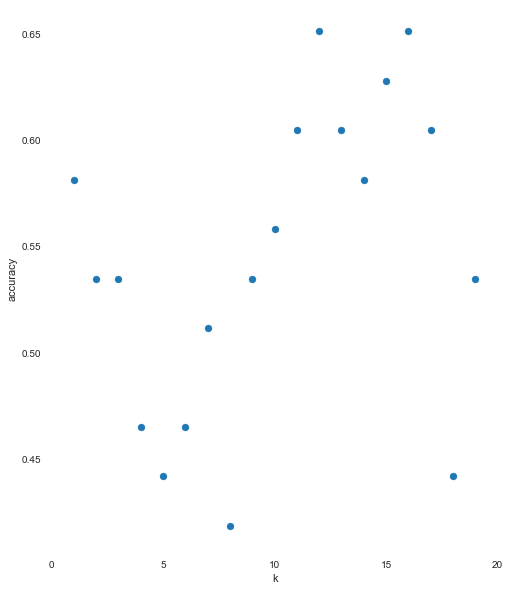

In [89]:
#Encontrar el número de K optimo
k_range = range(1, 20)
scores = []
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors = k)
    knn.fit(X_train, y_train)
    scores.append(knn.score(X_test, y_test))
plt.figure()
plt.xlabel('k')
plt.ylabel('accuracy')
plt.scatter(k_range, scores)
plt.xticks([0,5,10,15,20])

In [90]:
n_neighbors = 12
 
knn = KNeighborsClassifier(n_neighbors)
knn.fit(X_train, y_train)
print('Accuracy of K-NN en training: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN en classifieren test: {:.2f}'
     .format(knn.score(X_test, y_test)))


Accuracy of K-NN en training: 0.62
Accuracy of K-NN en classifieren test: 0.65


In [91]:
print(confusion_matrix(y_test, knn.predict(X_test)))
print(classification_report(y_test, knn.predict(X_test)))

[[13 11]
 [ 4 15]]
              precision    recall  f1-score   support

         0.0       0.76      0.54      0.63        24
         1.0       0.58      0.79      0.67        19

    accuracy                           0.65        43
   macro avg       0.67      0.67      0.65        43
weighted avg       0.68      0.65      0.65        43



In [92]:
knn.score(X_test, y_test)*100

65.11627906976744

In [93]:
print("MSE kNN = ", mean_squared_error(y_test, knn.predict(X_test)))

MSE kNN =  0.3488372093023256


## Modelo SVM

### Modelo SVM - Lineal

In [94]:
#Modelo SVM Lineal Simple

svm_model = svm.SVC(kernel='linear')
svm_model.fit(X_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [95]:
svm_report(svm_model)

Coeficientes:  

 [[ 1.24449996e-02  1.10389340e+00  1.20825299e-01  7.28684332e-01
  -7.61391602e-05  2.21692065e+01 -1.99241953e-01  8.59189738e+00
   6.85441398e-01  3.92726385e-01 -2.34120816e+01  5.29603028e-11
   4.66190595e-01]]

Intercepto:  

 [-22753.48332699]

Scores:  

 53.48837209302325

MSE:  

 0.46511627906976744

Matriz de Confusión:  

 [[ 8 16]
 [ 4 15]]

Reporte de Clasificación:  

               precision    recall  f1-score   support

         0.0       0.67      0.33      0.44        24
         1.0       0.48      0.79      0.60        19

    accuracy                           0.53        43
   macro avg       0.58      0.56      0.52        43
weighted avg       0.59      0.53      0.51        43



Valor de C:  

 1 


Coeficientes:  

 [[ 1.24449996e-02  1.10389340e+00  1.20825299e-01  7.28684332e-01
  -7.61391602e-05  2.21692065e+01 -1.99241953e-01  8.59189738e+00
   6.85441398e-01  3.92726385e-01 -2.34120816e+01  5.29603028e-11
   4.66190595e-01]]

Intercepto:  

 [-22753.48332699]

Scores:  

 53.48837209302325

MSE:  

 0.46511627906976744

Matriz de Confusión:  

 [[ 8 16]
 [ 4 15]]

Reporte de Clasificación:  

               precision    recall  f1-score   support

         0.0       0.67      0.33      0.44        24
         1.0       0.48      0.79      0.60        19

    accuracy                           0.53        43
   macro avg       0.58      0.56      0.52        43
weighted avg       0.59      0.53      0.51        43




Valor de C:  

 2 


Coeficientes:  

 [[ 2.41834943e-02  2.20774607e+00  2.41624106e-01  1.45704854e+00
  -1.52262334e-04  4.43300387e+01 -3.98403408e-01  1.71794514e+01
   1.37075934e+00  7.85517109e-01 -4.68036710e+01  1.29652733e-10
   9

([<matplotlib.axis.XTick at 0x2095f6b32c8>,
 <a list of 3 Text major ticklabel objects>)

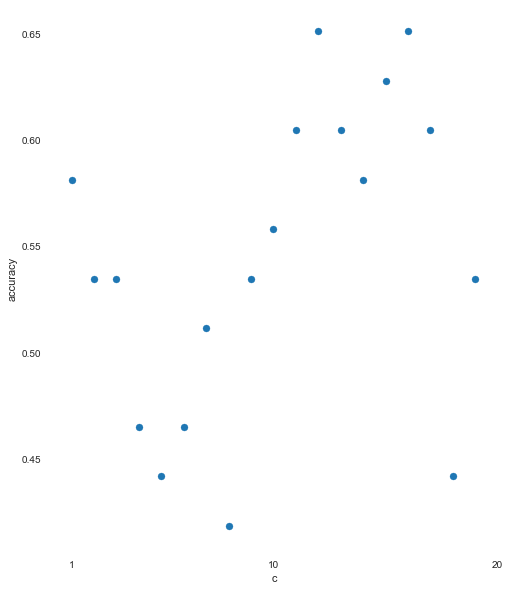

In [96]:
#Modelo SVM Lineal - C Óptimo

c_range = range(1, 20)
for c in c_range:
    svm_model = svm.SVC(kernel='linear', C = c)
    svm_model.fit(X_train, y_train)
    print(color.BOLD +"Valor de C: ", "\n"*2, c,"\n"*2+color.END)
    svm_report(svm_model)
    print("\n"*2)
plt.figure()
plt.xlabel('c')
plt.ylabel('accuracy')
plt.scatter(c_range, scores)
plt.xticks([1,10,20])

### Modelo SVM - Polinomial

In [97]:
#Modelo SVM Poly - C y Grados Óptimos

d_range = range(2, 6)

for d in d_range:
    svm_model = svm.SVC(kernel='poly', degree=d)
    svm_model.fit(X_train, y_train)
    print(color.BOLD +"Valor de Degree: ", "\n"*2, d,"\n"*2+color.END)
    svm_report_2(svm_model)
    print("\n"*2)  

Valor de Degree:  

 2 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Degree:  

 3 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Degree:  

 4 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Degree:  

 5 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]





### Modelo SVM - RBF


In [98]:
#Modelo SVM RBF - Gamma Óptimo

g_range = range(1, 20)

for g in g_range:
    svm_model = svm.SVC(kernel='rbf', gamma=g)
    svm_model.fit(X_train, y_train)
    print(color.BOLD +"Valor de Gamma: ", "\n"*2, g,"\n"*2+color.END)
    svm_report_2(svm_model)
    print("\n"*2) 

Valor de Gamma:  

 1 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Gamma:  

 2 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Gamma:  

 3 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Gamma:  

 4 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Gamma:  

 5 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Gamma:  

 6 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Gamma:  

 7 


Scores:  

 44.18604651162791

MSE:  

 0.5581395348837209

Matriz de Confusión:  

 [[ 0 24]
 [ 0 19]]



Valor de Gamma:  

 8 


Scores:  

 44.18604651162791

MSE:  

 0.558139534